#### AirBnB case study - i2i application

In this notebook we'll explore an AirBnB dataset containing listings in Amsterdam during 2016. We'll try to answer a few questions, but also explore to learn any interesting insights.

In any case, we're interested in:
- Recommendations based on this dataset to
    - the municipality of the city of Amsterdam
    - people renting out their homes
    - tourists visiting Amsterdam
- Any violations of the rental law during 2016, and the corresponding amount of money
- Return on investment of house rented out through AirBnB permanently

In [1]:
# Basic imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Load data
listings = pd.read_csv("data/Listings.csv")

Let's start with a basic exploratory data analysis of our dataset with `ydata-profiling`, which we will export in html for later reference. 

From a previous iteration, we could see there are quite some extreme outliers in the `price` and `minimum_nights` columns, which we want to clip to prevent them skewing later calculations using these values.

Furthermore, the `neighbourhood_group` column is empty, so we might as well drop it.

In [2]:
import ydata_profiling as yp


# Clip top 1% outliers in both columns
def clip_df(df, percentile=0.99):
    upper = df.quantile(percentile)
    return df.clip(lower=df.min(), upper=upper)


listings.price = clip_df(listings.price)
listings.minimum_nights = clip_df(listings.minimum_nights)

listings = listings.drop(["neighbourhood_group"], axis=1)

yp.ProfileReport(listings)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

To get an idea of the prices based on their geographical location we can plot these by their longitude and latitude.

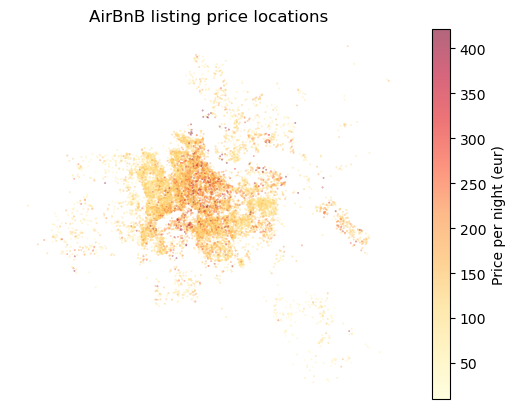

In [3]:
# Create the scatterplot with the prices along the colormap
listing_map = plt.scatter(
    listings.longitude,
    listings.latitude,
    c=listings.price,
    cmap="YlOrRd",
    marker="8",
    s=0.1,
    alpha=0.6,
)

# Labeling and cosmetics
cbar = plt.colorbar(listing_map)
cbar.set_label("Price per night (eur)")
plt.axis("off")
plt.title("AirBnB listing price locations")

# Save figure for later use
plt.savefig("listingprices_map.pdf")

This intuitively follows what one would expect - more central listings being more expensive. Just for fun, let's overlay the listing prices on a public dataset from the Amsterdam municipality containing the average housing price per square meter in 2016 (taken from https://maps.amsterdam.nl/open_geodata/)

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


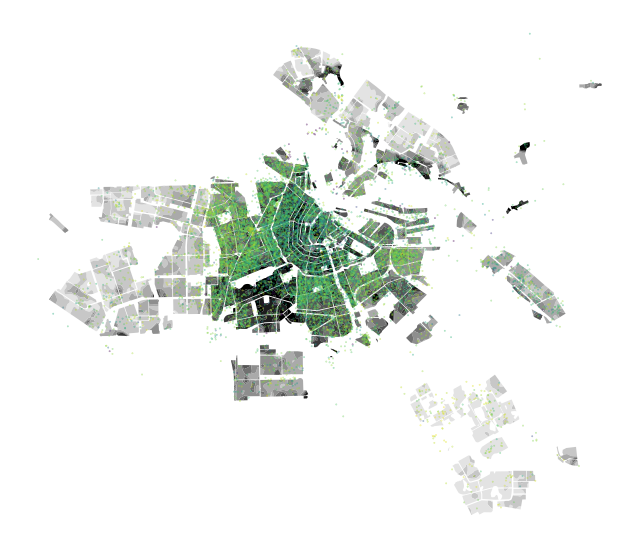

In [4]:
# Import for geographical mapping
import geopandas as gpd

# Load the Amsterdam house pricing geographical dataset
ams_house_pricing = gpd.read_file(
    "data/woningwaarde_map/WONINGWAARDE_2016_INFLATIE_region.shp"
)

# The coordinates in this dataset are in a different format, so we transform
# them to be compatible with the long-lat coordinates in the AirBnB dataset
ams_house_pricing_proj = ams_house_pricing.to_crs(
    {"proj": "longlat", "ellps": "WGS84", "datum": "WGS84"}
)

# Now plot the two, overlaying the listings on top of the pricing map
ams_house_pricing_proj.plot(
    column="SELECTIE", legend=False, cmap="gist_yarg", figsize=(8, 8)
).set_axis_off()
plt.scatter(
    listings.longitude,
    listings.latitude,
    c=listings.price,
    cmap="viridis_r",
    marker="8",
    s=0.1,
    alpha=0.6,
)

# Save figure for later use
plt.savefig("listingprices+houseprices_map.pdf")

Indeed we see there is a strong correlation between the average housing price and the listing prices, although there is quite some spread in the listing price. 

Let's look at the distribution of the prices in each neighbourhood, only looking at the 10 most common neighbourhoods for clarity. We furthermore again clip the prices at 300 euros per night for legibility.

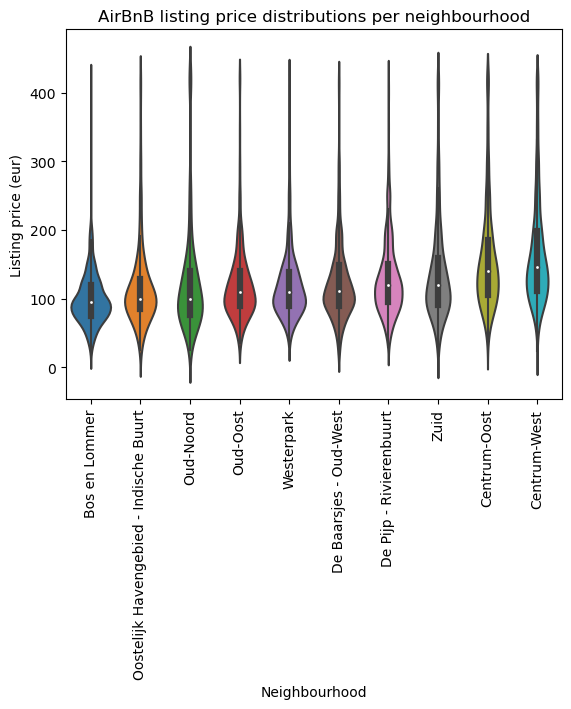

In [5]:
# We need seaborn for nice violin plots
import seaborn as sns

# Let's only look at the 10 most common neighbourhoods
com_neighbourhoods = listings.neighbourhood.value_counts().head(10)
listings_com_nghb = listings[listings["neighbourhood"].isin(com_neighbourhoods.index)]

# We'll order the neighbourhoods by median price
nghb_order = (
    listings_com_nghb.groupby(by=["neighbourhood"])["price"]
    .median()
    .sort_values()
    .index
)

# Violin plot
violin = sns.violinplot(
    data=listings_com_nghb,
    x="neighbourhood",
    y="price",
    order=nghb_order,
)

# Cosmetics
plt.title("AirBnB listing price distributions per neighbourhood")
plt.ylabel("Listing price (eur)")
plt.xlabel("Neighbourhood")
plt.xticks(rotation=90)

# Save figure for later use
plt.savefig("prices_neighbourhoods_violinplot.pdf")

Just as a sanity check, let's make groups by neighbourhood and plot their geographical location.

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


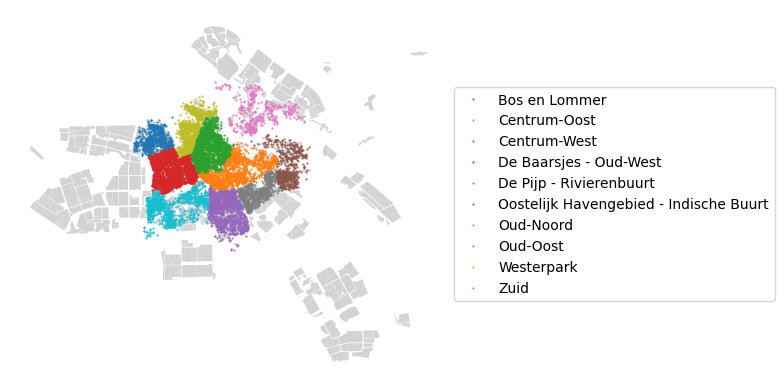

In [6]:
# Group by neighbourhood
neighborhood_groups = listings_com_nghb.groupby("neighbourhood")

# Housing price map as a background reference
ams_house_pricing_proj.plot(color="lightgray")

for name, group in neighborhood_groups:
    plt.plot(
        group.longitude,
        group.latitude,
        marker="8",
        linestyle="",
        markersize=0.5,
        label=name,
    )

# Cosmetics
plt.legend(loc="center left", bbox_to_anchor=(1, 0.5))
plt.axis("off")

# Save figure for later use
plt.savefig("neighbourhoods_map.pdf")

Besides the grouping by neighbourhood, we can also look at listing characteristics grouped by the type of listing, e.g. a share room or an entire apartment, stored in `room_type`. From the `ydata-profiling` report we can already see that most listings are by far for an entire home/apt.

In [7]:
listings.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

Let's first see how the price distribution differs per room type.

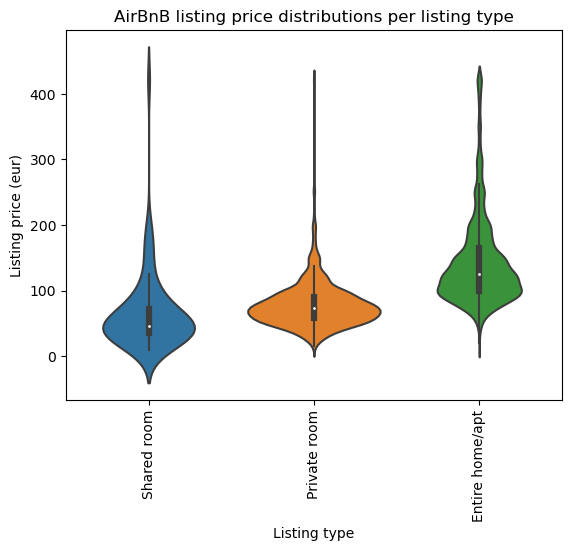

In [8]:
# Violin plot
violin = sns.violinplot(
    data=listings,
    x="room_type",
    y="price",
    order=["Shared room", "Private room", "Entire home/apt"],
)

# Cosmetics
plt.title("AirBnB listing price distributions per listing type")
plt.ylabel("Listing price (eur)")
plt.xlabel("Listing type")
plt.xticks(rotation=90)

# Save figure for later use
plt.savefig("prices_roomtype_violinplot.pdf")

The "staircase" feature present for the last category is interesting - perhaps related to prices being rounded to the nearest 10.

We can also make the geographical pricing maps grouped by listing type, which will hopefully reveal a stronger correlation with the location.

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:
/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:
/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


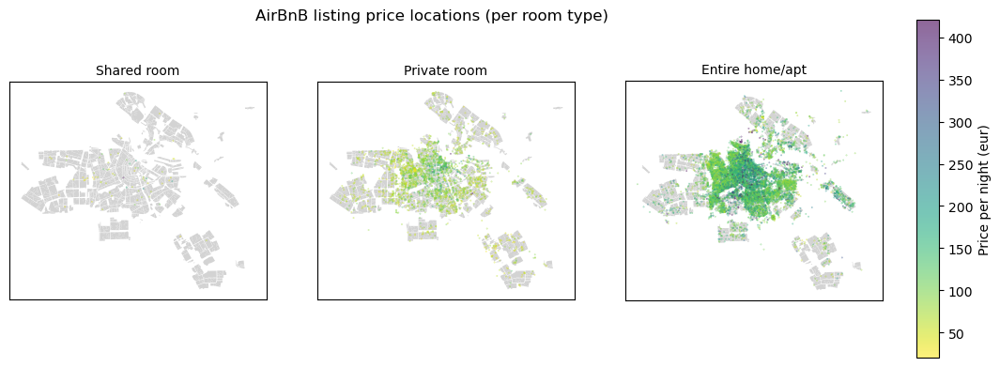

In [9]:
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))

# Loop through room types and create subplots
for ax, rtype in zip(axes.flat, ["Shared room", "Private room", "Entire home/apt"]):
    # Housing price map as a background reference
    ams_house_pricing_proj.plot(ax=ax, color="lightgray")

    im = ax.scatter(
        listings[listings.room_type == rtype].longitude,
        listings[listings.room_type == rtype].latitude,
        c=listings[listings.room_type == rtype].price,
        cmap="viridis_r",
        marker="8",
        s=0.1,
        alpha=0.6,
    )
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(rtype, size=10)

# Color bar and cosmetics
plt.xticks(visible=False)
plt.yticks(visible=False)

cbar_ax = fig.add_axes([0.93, 0.05, 0.02, 0.9])
fig.colorbar(im, ax=axes.tolist(), cax=cbar_ax, label="Price per night (eur)")

plt.suptitle("AirBnB listing price locations (per room type)")

# Save figure for later use
plt.savefig("listingprices_roomtype_map.pdf")

These maps follow the expectation from the previous violin plot, combined with the unequal numbers of room types.

Since we've explored most of the dataset related to pricing, let's calculate the return-on-investment.

### Return-on-investment (ROI) calculation

There are several ways of calculating the ROI, ranging from quite straightforward to very complex. Here are a few options:

1. Average housing price vs. average AirBnB revenue (per neighbourhood)

    Easiest would simply be to take the average price of a house in 2016 by neighbourhood as the investment, along with running costs such as energy bills, property taxes and mortgage costs, and take the revenue from renting out the average AirBnB listing in that neighbourhood as the returns. Of course most likely the rented out house would have been bought prior to 2016, so we could also use some type of average, taking inflation into account. We could split this by room type as well, since renting out a private or shared room in a house is obviously a different situation for the owner than renting out their entire house.

2. House price reconstruction from housing price data

    We can also attempt to more accurately reconstruct the investment by using the listing location to extrapolate its estimated cost from the housing price dataset. We could convert the price/m^2 to the estimated housing price using the average area of a house in Amsterdam, or also attempt to calculate that using a more granular approach using potential neighbourhood information, or even attempting to guess the size from the name of the listing (e.g. from words like "big" - suggesting a larger house - or "cozy" - suggesting a smaller one). This last option would likely require some NLP, which seems beyond the scope of the exercise.

The first option should be quite easy, so let's do that one first. I was able to find historical sales prices dating back to 1995 (from https://onderzoek.amsterdam.nl/dataset/woningmarkt-amsterdam), so that'll do.

In [10]:
# Load the data
prices_historical = pd.read_csv("data/verkoopprijzen_historisch.csv")

# Create dict containing the average 2016 prices by neighbourhood
prices_historical_dict = dict(
    zip(prices_historical["Locatie"], prices_historical["2016"])
)

This dataset only has granularity by district (standsdeel), as opposed to the AirBnB dataset, so we'll create a mapping:

In [11]:
print(prices_historical_dict.keys())

print(listings.neighbourhood.unique())

dict_keys(['Centrum', 'West', 'Nieuw-West', 'Zuid', 'Oost', 'Noord', 'Zuidoost', 'Weesp', 'Amsterdam'])
['Bijlmer-Oost' 'Noord-Oost' 'Noord-West' 'Oud-Noord'
 'IJburg - Zeeburgereiland' 'Centrum-West'
 'Oostelijk Havengebied - Indische Buurt' 'Centrum-Oost' 'Oud-Oost'
 'Watergraafsmeer' 'Gaasperdam - Driemond' 'Westerpark' 'Bijlmer-Centrum'
 'De Pijp - Rivierenbuurt' 'Zuid' 'Buitenveldert - Zuidas'
 'De Baarsjes - Oud-West' 'Bos en Lommer' 'Geuzenveld - Slotermeer'
 'Slotervaart' 'Osdorp' 'De Aker - Nieuw Sloten']


In [12]:
# Map from stadsdeel to wijk
nghb_map = {
    "Centrum": [
        "Centrum-West",
        "Centrum-Oost",
    ],
    "West": ["Westerpark", "De Baarsjes - Oud-West", "Bos en Lommer"],
    "Nieuw-West": [
        "Geuzenveld - Slotermeer",
        "Slotervaart",
        "Osdorp",
        "De Aker - Nieuw Sloten",
    ],
    "Zuid": ["Zuid", "Buitenveldert - Zuidas", "De Pijp - Rivierenbuurt"],
    "Oost": [
        "IJburg - Zeeburgereiland",
        "Oostelijk Havengebied - Indische Buurt",
        "Oud-Oost",
        "Watergraafsmeer",
    ],
    "Noord": ["Noord-Oost", "Noord-West", "Oud-Noord"],
    "Zuidoost": ["Bijlmer-Oost", "Bijlmer-Centrum"],
    "Weesp": ["Gaasperdam - Driemond"],
}

# Invert map for easier calculation later
nghb_map_inv = {}
for key, vals in nghb_map.items():
    for val in vals:
        nghb_map_inv.setdefault(val, []).append(key)

nghb_map_inv

{'Centrum-West': ['Centrum'],
 'Centrum-Oost': ['Centrum'],
 'Westerpark': ['West'],
 'De Baarsjes - Oud-West': ['West'],
 'Bos en Lommer': ['West'],
 'Geuzenveld - Slotermeer': ['Nieuw-West'],
 'Slotervaart': ['Nieuw-West'],
 'Osdorp': ['Nieuw-West'],
 'De Aker - Nieuw Sloten': ['Nieuw-West'],
 'Zuid': ['Zuid'],
 'Buitenveldert - Zuidas': ['Zuid'],
 'De Pijp - Rivierenbuurt': ['Zuid'],
 'IJburg - Zeeburgereiland': ['Oost'],
 'Oostelijk Havengebied - Indische Buurt': ['Oost'],
 'Oud-Oost': ['Oost'],
 'Watergraafsmeer': ['Oost'],
 'Noord-Oost': ['Noord'],
 'Noord-West': ['Noord'],
 'Oud-Noord': ['Noord'],
 'Bijlmer-Oost': ['Zuidoost'],
 'Bijlmer-Centrum': ['Zuidoost'],
 'Gaasperdam - Driemond': ['Weesp']}

Now we can calculate the average housing price for each neighbourhood in the AirBnB dataset. As a first check, let's see if there is any correlation between the listing price and the housing price. We can add a column to the listings dataset containing the average housing price for each listing. We'll only plot listings that are for the entire house/apartment.

<Axes: xlabel='avg_house_price', ylabel='price'>

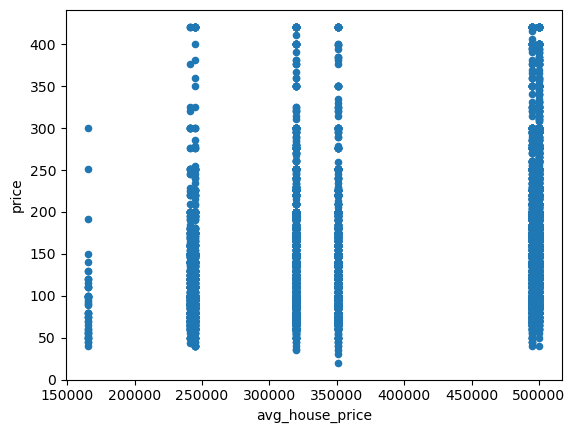

In [13]:
# Functions to map onto new columns
def get_distr(nghb):
    return nghb_map_inv[nghb][0]


def get_hp(nghb):
    return prices_historical_dict[nghb_map_inv[nghb][0]]


# Add district column and average housing price column
listings["district"] = listings.neighbourhood.apply(get_distr)
listings["avg_house_price"] = listings.neighbourhood.apply(get_hp)

# Create masked df for plots
listings_norooms = listings[
    (listings.price < 1000) & (listings.room_type == "Entire home/apt")
]

# Quick plot
listings_norooms.plot.scatter(x="avg_house_price", y="price")

There is certainly some correlation, although it's hard to see since the prices vary so wildly. Let's instead take the mean prices on the y-axis for each neighbourhood, as well as each district (and thus unique housing price category).

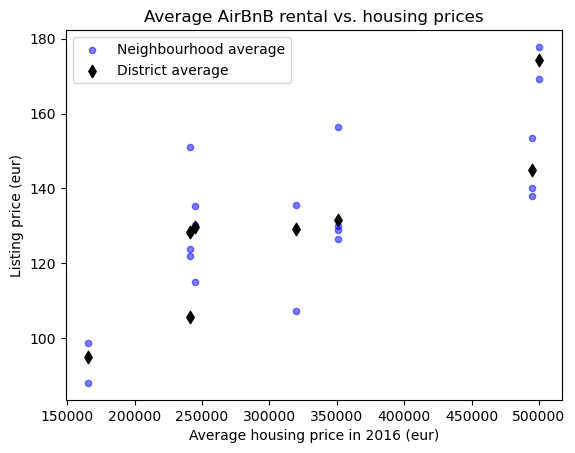

In [14]:
fig, ax = plt.subplots()

# Scatter plot grouped by neighbourhood
listings_norooms.groupby("neighbourhood").mean("price").plot.scatter(
    x="avg_house_price",
    y="price",
    marker="o",
    s=20,
    color="blue",
    alpha=0.5,
    ax=ax,
    label="Neighbourhood average",
)
# Scatter plot grouped by district
listings_norooms.groupby("district").mean("price").plot.scatter(
    x="avg_house_price",
    y="price",
    marker="d",
    s=40,
    color="black",
    ax=ax,
    label="District average",
)

# Cosmetics
plt.legend(loc="upper left")
plt.title("Average AirBnB rental vs. housing prices")
plt.ylabel("Listing price (eur)")
plt.xlabel("Average housing price in 2016 (eur)")

# Save figure
plt.savefig("avg_house_vs_airbnb_price.pdf")

This seems workable, so let's go ahead with the return on investment calculation. We'll take the following into account for the investment cost:
- Property price
    - We can either take the price in 2016 (and calculate the ROI if one were to enter the "AirBnB business" at the time of dataset creation), or estimate the price that was actually paid for the average listing in 2016 based on the historical price index and historical house sale frequency.
- Estimated mortgage, based on:
    - Initial downpayment
    - Length of mortgage
    - Mortgage interest rate
- Property taxes
- Insurance
- Heating and Electricity
- Internet
- Maintenence
- AirBnB fee

The revenue will be based on:
- Price per night
- Estimated nights/year that the listing is rented out
    - For this we have `availability_365`, which is the number of nights out of the coming year that the listing was available at the time the dataset was created in July 2016. Taking the number of nights/year that the listing is rented out from only this will likely give an underestimate, since bookings can still occur throughout the year. 
    - However, it can also be that a listing is not actually rented out for the coming year, but the host is simply not renting it out for a certain time. We have no way of distinguishing the two though. The only attempted correction we will make for this scenario is to assume that no booking is booked 365 days out of the coming year, and thus for those cases we will estimate the actual occupancy to be 0, since the host likely isn't actually renting out their property any longer.
    - We can try to correct for this using the number of reviews and the minimum number of nights a renter must book. It will come with a large margin of error, but let's give it a try.
    - There is not a lot of correlation between `availability_365` and `number_of_reviews` or `reviews_per_month`, so we have to make an educated guess.


In [15]:
def get_avg_days_since_last_review(last_reviews):
    avg_last_review = pd.to_datetime(last_reviews).mean()
    current_date = pd.to_datetime("2016-07-05")
    return (current_date - avg_last_review).days


print(
    f"Average number of days since last review: {get_avg_days_since_last_review(listings['last_review'])}"
)
print(f"Average number of reviews: {listings['number_of_reviews'].mean()}")

Average number of days since last review: 87
Average number of reviews: 15.426456783883314


In [16]:
def estimate_occupancy(
    val_availability_365,
    val_minimum_nights,
    val_reviews_per_month,
    val_number_of_reviews,
    val_last_review,
):
    # If no days left, assume host is no longer renting
    if val_availability_365 == 0:
        return 0

    # Additional bookings based on estimated bookings per month
    max_additional_bookings = 12.0 * val_reviews_per_month

    # Unclear when dataset was created, so let's take last review date plus 1 day
    current_date = pd.to_datetime("2016-07-05")

    # Number of days since last review
    days_since_last_review = (current_date - pd.to_datetime(val_last_review)).days

    # Correction based on last review, decreasing additional days if last review was
    # long ago, and slightly increasing if it was very recently
    # (1 at average number days ago, 1.4 at 0 days ago, and 0.5 at 2x average days ago or more)
    avg_days_since_last_review = 87.0

    factor_last_review = 1.0
    if days_since_last_review < avg_days_since_last_review:
        factor_last_review = max(
            0.5, 1.4 - (0.4 * days_since_last_review) / avg_days_since_last_review
        )
    elif days_since_last_review >= avg_days_since_last_review:
        factor_last_review = max(
            0.5,
            1
            - (days_since_last_review - avg_days_since_last_review)
            / 3.0
            * avg_days_since_last_review,
        )

    # Similar correction based on total number of reviews
    avg_number_of_reviews = 15.4
    factor_number_of_reviews = 1.0
    if val_number_of_reviews < avg_number_of_reviews:
        factor_number_of_reviews = (
            0.5 + (0.5 * val_number_of_reviews) / avg_number_of_reviews
        )
    elif val_number_of_reviews >= avg_number_of_reviews:
        factor_number_of_reviews = min(
            1.4,
            1
            + (val_number_of_reviews - avg_number_of_reviews)
            / 3.0
            * avg_number_of_reviews,
        )

    # Calculate the additional nights to add
    additional_nights = (
        val_minimum_nights
        * max_additional_bookings
        * factor_last_review
        * factor_number_of_reviews
    )

    # Adjust for the number of nights already booked
    estimated_occupancy = min(365 - val_availability_365 + additional_nights, 365)

    return estimated_occupancy

In [17]:
# Fill the NaNs for last review date and reviews per month
listings["last_review"] = listings["last_review"].fillna("2000-01-01")
listings["reviews_per_month"] = listings["reviews_per_month"].fillna(0.0)

# Calculate estimated occupancy
listings["estimated_occupancy"] = listings.apply(
    lambda x: estimate_occupancy(
        x.availability_365,
        x.minimum_nights,
        x.reviews_per_month,
        x.number_of_reviews,
        x.last_review,
    ),
    axis=1,
)

# Add current occupancy column for easier checking
listings["current_occupancy"] = 365 - listings["availability_365"]

Let's have a look at if our estimate makes sense:

In [18]:
listings[
    [
        "minimum_nights",
        "last_review",
        "number_of_reviews",
        "current_occupancy",
        "estimated_occupancy",
    ]
].head(10)

,minimum_nights,last_review,number_of_reviews,current_occupancy,estimated_occupancy
0,1,2016-06-27,5,0,8.776294
1,1,2016-06-27,4,288,329.215226
2,5,2016-01-02,11,342,354.342857
3,1,2016-05-31,2,355,365.000000
4,14,2016-03-22,12,27,75.572727
5,2,2000-01-01,0,356,356.000000
6,2,2016-06-26,24,19,42.281324
7,2,2016-05-06,1,324,331.182803
8,2,2016-06-27,1,326,343.420869
9,1,2016-05-13,1,365,0.000000


It's certainly not perfect, with probably too much weight being given to the minimum_nights column, but I think it's a decent attempt that could be improved with more time if wanted.

We can also look at some distributions:

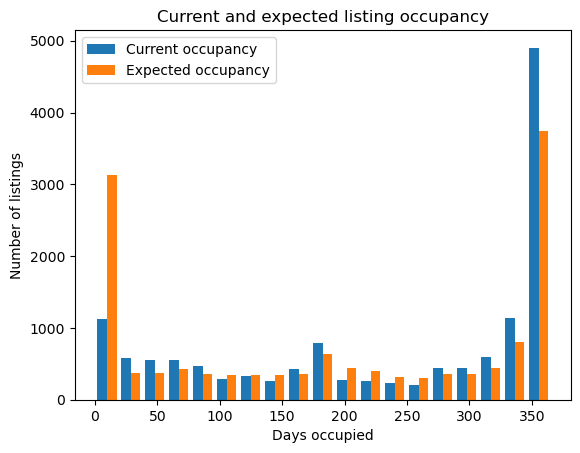

In [19]:
plt.hist(
    [listings.current_occupancy, listings.estimated_occupancy],
    bins=np.linspace(0, 365, 20),
    label=["Current occupancy", "Expected occupancy"],
)
plt.title("Current and expected listing occupancy")
plt.ylabel("Number of listings")
plt.xlabel("Days occupied")
plt.legend()

plt.savefig("current_and_expected_occupancy.pdf")

As an aside, we can do a quick and dirty analysis of the listing titles and see if we can deduce any insights that relate to the expected occupancy. With more time, we could do a proper NLP analysis, but for now I will only check whether it is a good idea to capitalise words in the title to potentially attract readers to your advertisement.

In [20]:
def percentage_name_cap(val_name):
    val_name = val_name.strip()

    # Split sentence into words
    words = val_name.split()

    # Count number of capitalized words
    capitalized_count = sum(1 for word in words if word.istitle())

    # Return percentage
    if words:
        percentage = (capitalized_count / len(words)) * 100
        return percentage
    else:
        return 0
    
# Add a new feature
listings["perc_name_cap"] = listings.name.map(lambda x: percentage_name_cap(x))

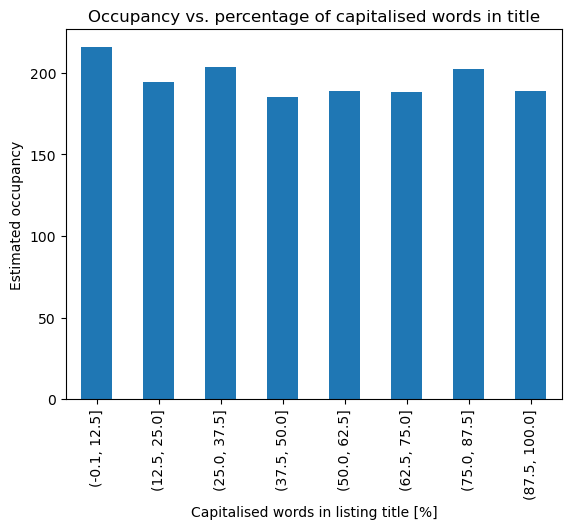

In [21]:
# Group the data
bins = pd.cut(listings["perc_name_cap"], bins=8)
grouped_perc_caps = listings.groupby(bins)["estimated_occupancy"].mean()

grouped_perc_caps.plot.bar()

plt.xlabel("Capitalised words in listing title [%]")
plt.ylabel("Estimated occupancy")
plt.title("Occupancy vs. percentage of capitalised words in title")

# Save figure
plt.savefig("occupancy_vs_perc_capitalised_words.pdf")

Now let's get back to the ROI calculation, starting with the mortgage costs.

In [22]:
def calculate_yearly_mortgage_cost(
    property_price, downpayment, mortgage_length, interest_rate
):
    # Calculate the loan amount (principal)
    loan_amount = property_price - downpayment

    # Convert the annual interest rate to a monthly rate and the mortgage length to months
    monthly_interest_rate = interest_rate / 12.
    num_months = mortgage_length * 12.

    # Calculate the monthly mortgage payment using the formula for a fixed-rate mortgage
    monthly_payment = (
        loan_amount
        * (monthly_interest_rate * (1 + monthly_interest_rate) ** num_months)
        / ((1 + monthly_interest_rate) ** num_months - 1)
    )

    # Calculate the yearly mortgage cost by multiplying the monthly payment by 12
    yearly_mortgage_cost = monthly_payment * 12.

    return yearly_mortgage_cost

Now to estimate the variables for this calculation. The estimated price paid we can take from our average price per district, combined with a table of historical price index and house sale frequency data taken from the CBS (https://www.cbs.nl/nl-nl/cijfers/detail/83906NED#). This table only goes back to 1995 though and has gaps of 5 years until 2015, so we have to interpolate for those years:

In [23]:
# Read data and select only necessary columns
historical_sale_data_full = pd.read_csv("data/verkoopcijfers_tabel.csv")
historical_sale_data = historical_sale_data_full[
    [
        "Perioden",
        "Aantal verkochte woningen Aantal verkochte woningen (aantal)",
        "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)",
    ]
].head(6)

# Convert values and correct for commas and periods
historical_sale_data["Perioden"] = pd.to_numeric(historical_sale_data["Perioden"])
historical_sale_data[
    "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
] = pd.to_numeric(
    historical_sale_data["Aantal verkochte woningen Aantal verkochte woningen (aantal)"]
    .astype(str)
    .str.replace(".", "")
)
historical_sale_data[
    "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
] = pd.to_numeric(
    historical_sale_data[
        "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
    ].str.replace(",", ".")
)

# Reindex with missing years
years = pd.Index(range(1995, 2016 + 1), name="Perioden")
historical_sale_data = (
    historical_sale_data.set_index("Perioden").reindex(years).reset_index()
)

# Interpolate for the missing years
historical_sale_data[
    "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
] = historical_sale_data[
    "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
].interpolate(
    method="linear"
)
historical_sale_data[
    "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
] = historical_sale_data[
    "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
].interpolate(
    method="linear"
)

historical_sale_data

,Perioden,Aantal verkochte woningen Aantal verkochte woningen (aantal),Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)
0,1995,154568.0,42.50
1,1996,161526.0,50.06
2,1997,168484.0,57.62
3,1998,175442.0,65.18
4,1999,182400.0,72.74
5,2000,189358.0,80.30
6,2001,192812.2,85.56
7,2002,196266.4,90.82
8,2003,199720.6,96.08
9,2004,203174.8,101.34


Let's have a look at how the price and sale frequency developed over the years.

Text(0.5, 1.0, 'Historical house sales')

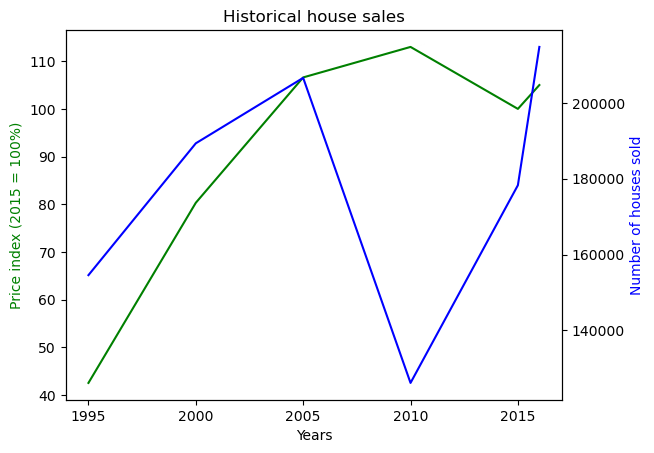

In [24]:
fig, ax1 = plt.subplots()
ax2 = ax1.twinx()
ax1.plot(
    historical_sale_data["Perioden"],
    historical_sale_data[
        "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
    ],
    "g-",
)
ax2.plot(
    historical_sale_data["Perioden"],
    historical_sale_data[
        "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
    ],
    "b-",
)

ax1.set_xlabel("Years")
ax1.set_ylabel("Price index (2015 = 100%)", color="g")
ax2.set_ylabel("Number of houses sold", color="b")
plt.title("Historical house sales")

We can clearly see the dip from the 2008 crisis, which is not approximated well by our linear interpolation we had to do due to missing data.

Now we can calculate the average price someone paid for a house that they own in 2016. This will only take into account data dating back to 1995, so this will be a systematic uncertainty in our calculation, which we currently have no way of estimating however.

In [25]:
def calculate_avg_price_historical(current_avg_price, historical_sale_data):
    weighted_sum = (
        historical_sale_data[
            "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
        ]
        * historical_sale_data[
            "Prijsindex verkoopprijzen Prijsindex bestaande koopwoningen (2015=100)"
        ]
        / 100.0
        * current_avg_price
    ).sum()
    total_sales = historical_sale_data[
        "Aantal verkochte woningen Aantal verkochte woningen (aantal)"
    ].sum()
    weighted_avg_price = weighted_sum / total_sales

    return weighted_avg_price

Now to calculate the total investment, we use the following:

- The current property price we will of course take by district using our map. 

- The downpayment is hard to estimate, but let's put this at 10% of the property price. 

- The most common mortgage length in the Netherlands is also the longest, which is 30 years. 

- The interest rate has historically fluctuated quite a bit, but since we are only using data dating back to 1995 regarding the housing prices, we will use the average since that time. We could construct a weighted sum using the number of houses sold each year, but it seems very hard to get reliable mortgage interest rate data that dates back far enough. So we will use 4% based on an aggregate of online sources.

- The property tax is 1.2% in the Netherlands, which we will simply calculate using the estimated paid property price (actually based on WOZ value, but will approximate here).

- The AirBnB fee of 3% flat.

- Other monthly costs:
    - Heating and electricity: 100 eur
    - Internet: 50 eur
    - Insurance: 75 eur
    - Maintenence: 25 eur
    
We can calculate the total ROI at the end of the mortgage period as the total net profit as a percentage of the initial investment, and also calculate the annualised ROI as the annual net profit as a percentage of the initial investment.

In [26]:
# Annual net profit as a percentage of the initial investment
def calculate_yearly_ROI(
    downpayment,
    yearly_mortgage_cost,
    yearly_property_tax,
    yearly_income,
    monthly_expenses,
):
    # Calculate annual net profit
    annual_net_profit = yearly_income - (
        yearly_mortgage_cost + yearly_property_tax + (monthly_expenses * 12)
    )

    # Calculate the initial investment (property price plus 5% closing costs)
    initial_investment = 1.05 * downpayment

    # Calculate the annual ROI
    annual_roi = (annual_net_profit / initial_investment) * 100

    return annual_roi


# Total net profit over mortgage period as a percentage of initial investment
def calculate_total_ROI(
    downpayment,
    yearly_mortgage_cost,
    yearly_property_tax,
    yearly_income,
    monthly_expenses,
    mortgage_years,
):
    # Calculate annual net profit
    annual_net_profit = yearly_income - (
        yearly_mortgage_cost + yearly_property_tax + (monthly_expenses * 12)
    )

    # Calculate the initial investment (property price plus 5% closing costs)
    initial_investment = 1.05 * downpayment

    # Calculate the total net profit over the mortgage period
    total_net_profit = annual_net_profit * mortgage_years

    # Calculate the total ROI
    total_roi = (total_net_profit / initial_investment) * 100

    return total_roi

These are the functions we need to calculate the ROIs for an individual listing. Let's make an umbrella function to easily add new columns to the `listings` dataframe.

In [27]:
def get_both_ROI(val_price, val_estimated_occupancy, val_avg_house_price):
    property_price = calculate_avg_price_historical(
        val_avg_house_price, historical_sale_data
    )
    downpayment = 0.1 * property_price

    mortgage_length = 30
    interest_rate = 0.04
    yearly_mortgage_cost = calculate_yearly_mortgage_cost(
        property_price, downpayment, mortgage_length, interest_rate
    )

    yearly_property_tax = 0.012
    monthly_expenses = 250
    airbnb_fee = 0.03

    yearly_income = val_price * val_estimated_occupancy * (1 - airbnb_fee)

    mortgage_years = 30

    return (
        calculate_yearly_ROI(
            downpayment,
            yearly_mortgage_cost,
            yearly_property_tax,
            yearly_income,
            monthly_expenses,
        ),
        calculate_total_ROI(
            downpayment,
            yearly_mortgage_cost,
            yearly_property_tax,
            yearly_income,
            monthly_expenses,
            mortgage_years,
        ),
    )


# Now add the new columns - let's only do this for the listings of entire houses / apartments
listings_entireapt_only = listings[listings.room_type == "Entire home/apt"].copy()

listings_entireapt_only["yearly_ROI"], listings_entireapt_only["total_ROI"] = zip(
    *listings_entireapt_only.apply(
        lambda x: get_both_ROI(x.price, x.estimated_occupancy, x.avg_house_price),
        axis=1,
    )
)

Now that we've calculated the annualised and total ROIs for each listing, let's have a look.

In [28]:
print(
    listings_entireapt_only[
        ["price", "estimated_occupancy", "avg_house_price", "yearly_ROI", "total_ROI"]
    ].sample(15)
)

       price  estimated_occupancy  avg_house_price  yearly_ROI    total_ROI
2390     125           240.215065           500344    4.809457   144.283725
4464      90           240.568607           500344  -11.956530  -358.695913
7779     149           365.000000           495009   54.674640  1640.239192
6301     111           365.000000           319813   68.089550  2042.686507
3649      89             0.000000           350939  -57.932223 -1737.966702
7708     185             2.617978           495009  -54.383326 -1631.499782
3270     139           365.000000           350939   86.862362  2605.870856
3119     166            11.936158           350939  -52.277423 -1568.322686
13651    251           190.000000           240836  136.359664  4090.789905
3899     100           139.341818           500344  -27.403941  -822.118230
11483    235           317.193103           319813  174.646837  5239.405104
6294      95           355.000000           319813   46.825306  1404.759180
11762    299

This seems to follow our intuition. At first glance there seem to be a lot of rows with negative earnings, which might seem problematic. But it's important to note that the owners of the corresponding listings have significantly invested in a house or apartment, which obviously has a lot of value too, and thus negative earnings does not necessarily equate to losing money.

Let's also look at the distributions, separated by neighbourhood.

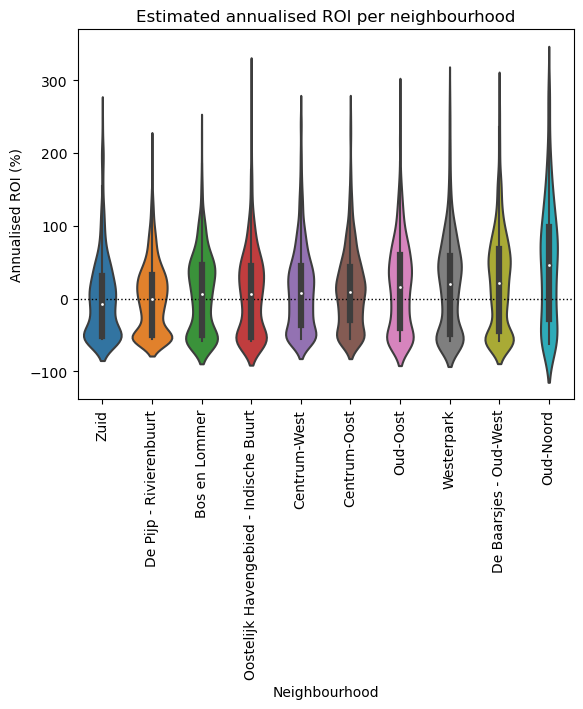

In [29]:
# Again pick 10 most common neighbourhoods
com_neighbourhoods = listings_entireapt_only.neighbourhood.value_counts().head(10)
listings_com_nghb = listings_entireapt_only[
    listings_entireapt_only["neighbourhood"].isin(com_neighbourhoods.index)
]

# We'll order the neighbourhoods by median yearly ROI
nghb_order = (
    listings_com_nghb.groupby(by=["neighbourhood"])["yearly_ROI"]
    .median()
    .sort_values()
    .index
)

# Horizontal line
plt.hlines(y=0, xmin=-2, xmax=10, color="black", linewidth=1, linestyle="dotted")

# Violin plot - clip outlier ROIs
violin = sns.violinplot(
    data=listings_com_nghb[listings_com_nghb.yearly_ROI < 300],
    x="neighbourhood",
    y="yearly_ROI",
    order=nghb_order,
)

# Cosmetics
plt.title("Estimated annualised ROI per neighbourhood")
plt.ylabel("Annualised ROI (%)")
plt.xlabel("Neighbourhood")
plt.xticks(rotation=90)

# Save figure for later use
plt.savefig("yearly_ROIs_neighbourhoods_violinplot.pdf")

This looks reasonable, although the distributions look somewhat double-lobed which I would not have expected. Let's also look at the total ROI, which will be proportional.

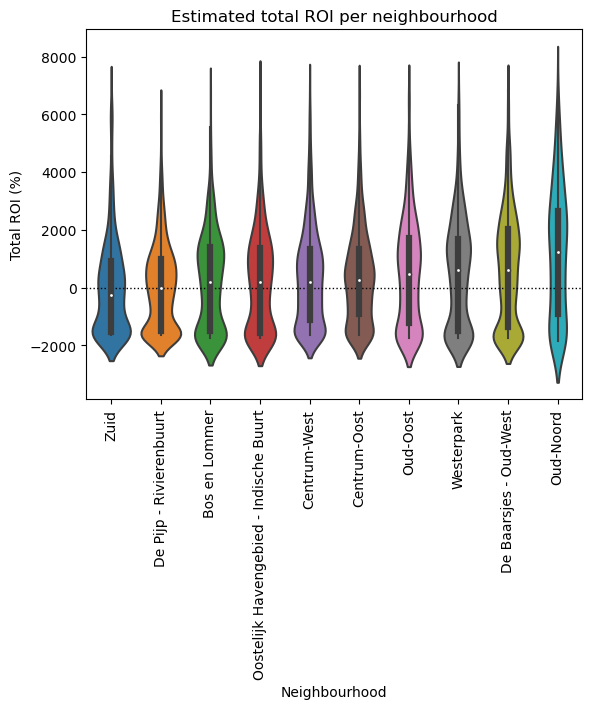

In [30]:
# Horizontal line
plt.hlines(y=0, xmin=-2, xmax=10, color="black", linewidth=1, linestyle="dotted")

# Violin plot - clip outlier ROIs
violin = sns.violinplot(
    data=listings_com_nghb[listings_com_nghb.total_ROI < 7000],
    x="neighbourhood",
    y="total_ROI",
    order=nghb_order,
)

# Cosmetics
plt.title("Estimated total ROI per neighbourhood")
plt.ylabel("Total ROI (%)")
plt.xlabel("Neighbourhood")
plt.xticks(rotation=90)

# Save figure for later use
plt.savefig("total_ROIs_neighbourhoods_violinplot.pdf")

Since we have a trend by neighbourhood, it might be fun to look at the geographical distribution as well:

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


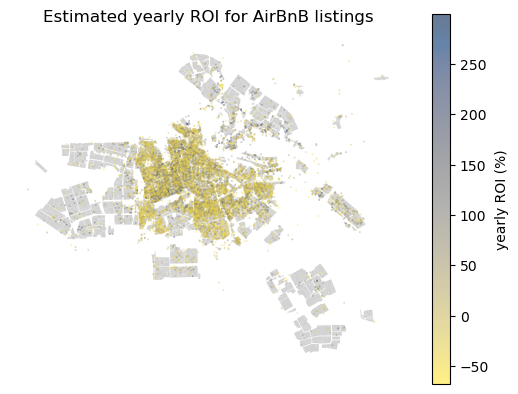

In [31]:
# Let's clip the yearly ROIs similar to what we did for the violin plot
listings_ROIclipped = listings_entireapt_only[listings_entireapt_only.yearly_ROI < 300]

# Housing price map as a background reference
ams_house_pricing_proj.plot(color="lightgray")

# Create the scatterplot with the yearly ROI along the colormap
listing_map = plt.scatter(
    listings_ROIclipped.longitude,
    listings_ROIclipped.latitude,
    c=listings_ROIclipped.yearly_ROI,
    cmap="cividis_r",
    marker="8",
    s=0.1,
    alpha=0.6,
)

# Labeling and cosmetics
cbar = plt.colorbar(listing_map)
cbar.set_label("yearly ROI (%)")
plt.axis("off")
plt.title("Estimated yearly ROI for AirBnB listings")

# Save figure for later use
plt.savefig("yearly_ROIs_map.pdf")

We can also look at only those listings that, according to our (nonperfect) calculations, do not turn a profit:

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


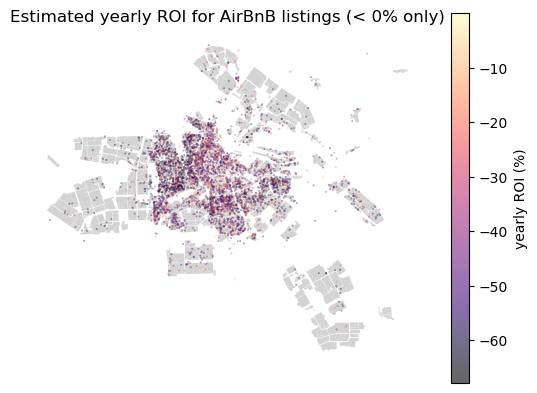

In [32]:
listings_ROIclipped_noprofit = listings_ROIclipped[listings_ROIclipped.yearly_ROI < 0]

# Housing price map as a background reference
ams_house_pricing_proj.plot(color="lightgray")

# Create the scatterplot with the yearly ROI along the colormap
listing_map = plt.scatter(
    listings_ROIclipped_noprofit.longitude,
    listings_ROIclipped_noprofit.latitude,
    c=listings_ROIclipped_noprofit.yearly_ROI,
    cmap="magma",
    marker="8",
    s=0.1,
    alpha=0.6,
)

# Labeling and cosmetics
cbar = plt.colorbar(listing_map)
cbar.set_label("yearly ROI (%)")
plt.axis("off")
plt.title("Estimated yearly ROI for AirBnB listings (< 0% only)")

# Save figure for later use
plt.savefig("yearly_ROIs_map_noprofit.pdf")

Due to the spread in distributions there are no trends in either plot that absolutely jump out, although there are definitely a few things we can learn. 
- It typically seems more profitable to rent out listings outside of the center.
- Being close to the water is profitable (higher asking price - although also higher housing price which we did not take into account).

#### Tourist recommendations

Besides gaining insights for hosts, we can use the above calculations to see if we can find recommendations for tourists staying in Amsterdam to find the best value for money. Naively this would correspond to finding the houses with the lowest ROI, i.e. the latest plot above, but we need to first factor out the estimated occupancy. In the end, the best value for money for a tourist will depend on the ratio between the price per night and the value of the property they will be staying in.

Thus, we can add a new feature containing this value, and analysing it to see if we find some trends, starting with the per-neighbourhood distributions.

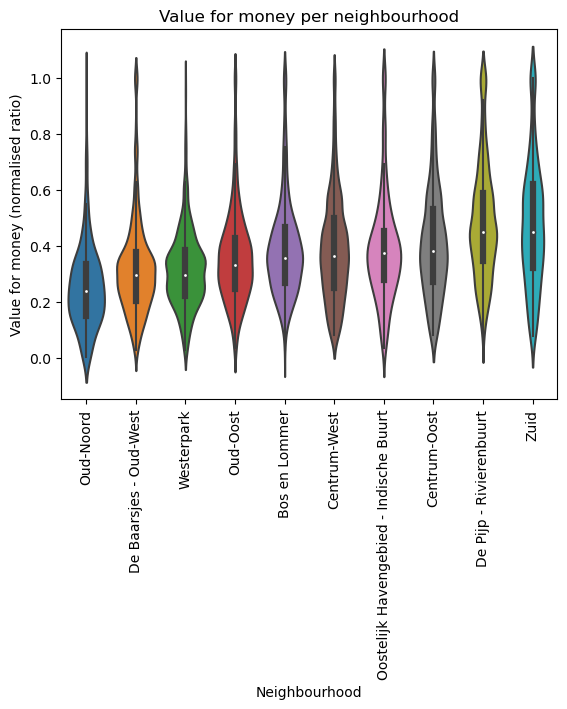

In [33]:
# Add new feature
listings["value_for_money"] = listings.avg_house_price / listings.price

# There are again some outliers, so clip them and normalise
listings.value_for_money = clip_df(listings.value_for_money, percentile=0.98)

listings.value_for_money = (
    listings.value_for_money - listings.value_for_money.min()
) / (listings.value_for_money.max() - listings.value_for_money.min())

# Again pick 10 most common neighbourhoods
com_neighbourhoods = listings.neighbourhood.value_counts().head(10)
listings_com_nghb = listings[listings["neighbourhood"].isin(com_neighbourhoods.index)]

# We'll order the neighbourhoods by median ratio
nghb_order = (
    listings_com_nghb.groupby(by=["neighbourhood"])[
        "value_for_money"
    ]
    .median()
    .sort_values()
    .index
)

# Violin plot grouped per neighbourhood
violin = sns.violinplot(
    data=listings_com_nghb,
    x="neighbourhood",
    y="value_for_money",
    order=nghb_order,
)

# Cosmetics
plt.title("Value for money per neighbourhood")
plt.ylabel("Value for money (normalised ratio)")
plt.xlabel("Neighbourhood")
plt.xticks(rotation=90)

# Save figure for later use
plt.savefig("value_for_money_tourists_neighbourhoods_violinplot.pdf")

So we indeed see some trends related to neighbourhood, with the above plot expectedly showing the inverse behaviour of the ROIs.

Let's also look at the geographical distributions:

/Users/talvandaalen/miniforge3/lib/python3.10/site-packages/geopandas/plotting.py:48: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


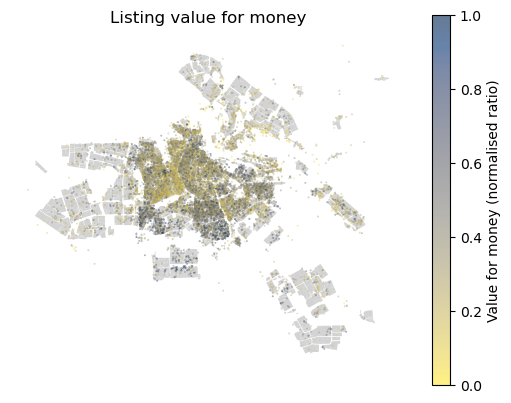

In [34]:
# Housing price map as a background reference
ams_house_pricing_proj.plot(color="lightgray")

# Create the scatterplot with the yearly ROI along the colormap
listing_map = plt.scatter(
    listings.longitude,
    listings.latitude,
    c=listings.value_for_money,
    cmap="cividis_r",
    marker="8",
    s=0.1,
    alpha=0.6,
)

# Labeling and cosmetics
cbar = plt.colorbar(listing_map)
cbar.set_label("Value for money (normalised ratio)")
plt.axis("off")
plt.title("Listing value for money")

# Save figure for later use
plt.savefig("value_for_money_tourists_map.pdf")

Indeed we see that the best value for money is usually found in Zuid and De Pijp / Rivierenbuurt.

### Host behaviour and rental law violations

Let's now turn to analysing the behaviour of the hosts in the dataset, and try to assess whether any violations of the rental law were made and, if so, what amount of money was involved.

The rental law in the city of Amsterdam during 2016 states that the owner of a property cannot rent their property out for more than 60 days a year. AirBnB was not enforcing this until January 1st 2017.

To make this assessment we can use our estimated occupancy used to calculate the ROI. Even though this value aims to estimate the occupancy in the year after July 2016, it's most likely a decent approximation that the occupancy/year remains about the same historically. Simply looking at the plot we made earlier of expected occupancy, the majority of listings is rented out more than 60 days a year:

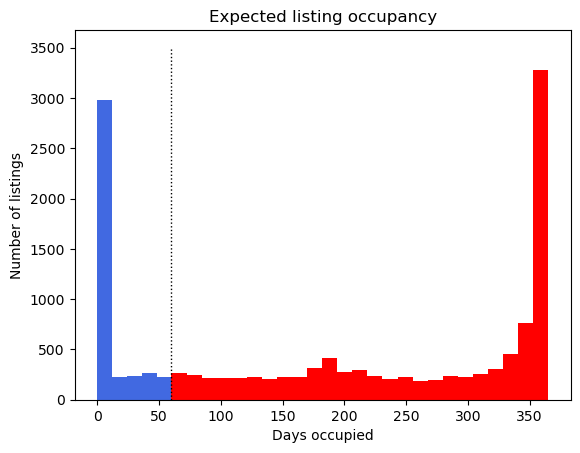

In [35]:
# Split below and above 60 days estimated occupancy
listings_below60days = listings[listings.estimated_occupancy < 60]
listings_above60days = listings[listings.estimated_occupancy >= 60]

ax = plt.hist(
    listings_below60days.estimated_occupancy,
    bins=np.linspace(0, 60, 6),
    color="royalblue",
)
plt.hist(
    listings_above60days.estimated_occupancy, bins=np.linspace(60, 365, 26), color="red"
)
plt.vlines(x=60, ymin=0, ymax=3500, color="black", linewidth=1, linestyle="dotted")
plt.title("Expected listing occupancy")
plt.ylabel("Number of listings")
plt.xlabel("Days occupied")

plt.savefig("expected_occupancy_violations.pdf")

So clearly the majority of hosts in in violation of this law. Specifically:

In [36]:
perc_violating_hosts = 100 * float(
    len(listings_above60days.host_id.unique()) / len(listings.host_id.unique())
)

print("Portion of hosts violating 60 day law: {:.2f}%".format(perc_violating_hosts))

Portion of hosts violating 60 day law: 72.23%


We can estimate the number of revenue that is therefore illegally being collected by hosts as follows:

In [37]:
def calculate_illegal_income(val_price, val_estimated_occupancy):
    if val_estimated_occupancy <= 60.0:
        return 0
    return (val_estimated_occupancy - 60.0) * val_price


listings["illegal_income"] = listings.apply(
    lambda x: calculate_illegal_income(x.price, x.estimated_occupancy), axis=1
)

Let's look at the illegal income made.

Total amount of illegal income made 266.59 M eur


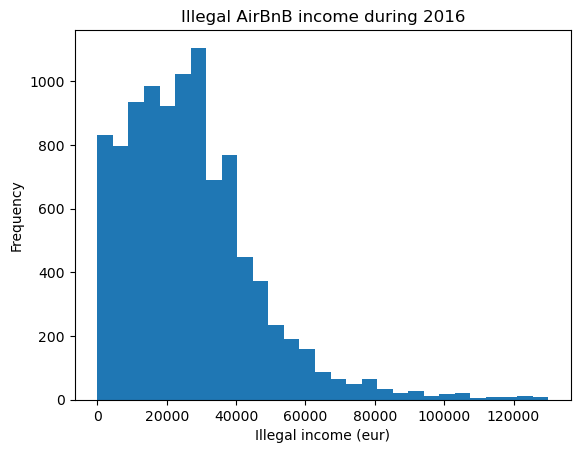

In [38]:
print(
    "Total amount of illegal income made {:.2f} M eur".format(
        listings.illegal_income.sum() / 1000000.0
    )
)

# Filter the =0 values
listings.illegal_income[listings.illegal_income > 0].plot.hist(
    bins=np.linspace(0, 130000, 30)
)
plt.title("Illegal AirBnB income during 2016")
plt.xlabel("Illegal income (eur)")

plt.savefig("illegal_income_hist.pdf")

So we estimate that over 266 million euro is illegally being made per year by AirBnB hosts during 2016. To me, at least, this seems like an enormous amount.

We can look a bit more closely at what individual hosts are contributing to this amount. In the `calculated_host_listings_count` distribution we saw in the profile report, some hosts had more than 150 listings. I have a suspicion that a disproportionate amount of money is illegally being made by these "high-count" hosts.

Some hosts have the same `host_name`, so we have to select by `host_id`:

In [39]:
print(len(listings.host_id.unique()), len(listings.host_name.unique()))

11464 4441


Let's look at the 20 hosts with the most listings in the dataset:

In [40]:
top_host_listings = listings.sort_values(
    "calculated_host_listings_count", ascending=False
)
top_host_ids = top_host_listings.host_id.drop_duplicates().head(20)

# Only take top 20 hosts
top_host_listings = top_host_listings[top_host_listings.host_id.isin(top_host_ids)]

print(f"Total listings posted by top 20 hosts: {len(top_host_listings)}")

print(top_host_listings.sample(10))

Total listings posted by top 20 hosts: 852
             id                                             name   host_id  \
10381   2981798                        Secret Bookcase Room (22)  14574533   
4777    4691668                Close to museums & famous canals!   4979621   
5413   13681656  GORGEOUS apt. with bath + balcony. Trendy East!    669178   
8570    2104350              Amazing Loft @ Great Neighbourhood!   6999042   
9394   10144500                 Spacious apt. next to vondelpark   4979621   
1224   11058104                      AMAZING apt in CITY CENTER!   1464510   
10671   2497424                   STYLISH APT+NEXT2 REMBRANDPARK  14183886   
7395   11447077               SPACIOUS & MODERN APT with GARDEN!   1464510   
2170   13647767                                    Flower Estate  48703385   
2446    6040141              Amazing Canal Loft@Oldest part-City   6999042   

              host_name            neighbourhood   latitude  longitude  \
10381   Hotel Not Hotel 

Let's first see how many listings these top hosts have.

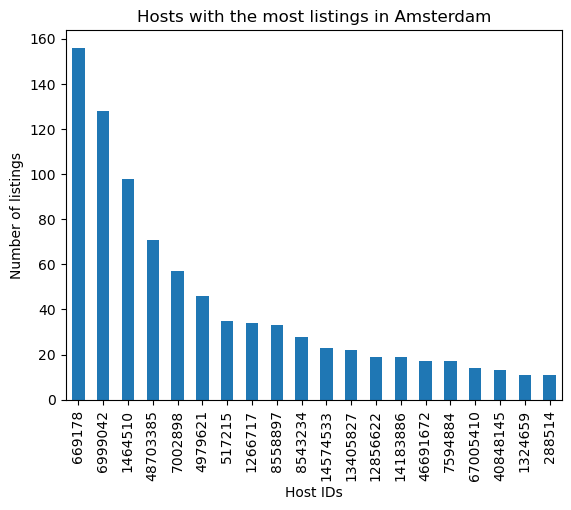

In [41]:
# Create the series to plot
listing_counts = top_host_listings.groupby(
    "host_id"
).calculated_host_listings_count.count()

# Sort by listing count
listing_counts.sort_values(ascending=False).plot.bar()
plt.title("Hosts with the most listings in Amsterdam")
plt.ylabel("Number of listings")
plt.xlabel("Host IDs")

# Save for later use
plt.savefig("number_listings_top_hosts.pdf")

So some hosts have over 150 listings. Let's see how much illegal income they make.

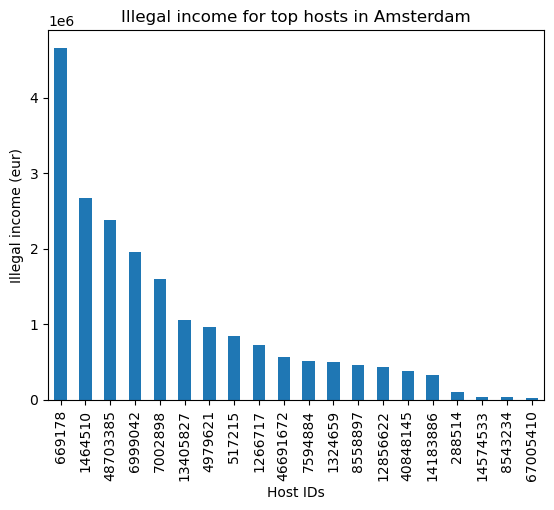

In [42]:
# Create the series to plot
money_sum = top_host_listings.groupby(
    "host_id"
).illegal_income.sum()

# Sort by sum
money_sum.sort_values(ascending=False).plot.bar()
plt.title("Illegal income for top hosts in Amsterdam")
plt.ylabel("Illegal income (eur)")
plt.xlabel("Host IDs")

# Save for later use
plt.savefig("illegal_income_top_hosts.pdf")

In [43]:
print(f"Top huisjesmelker: {top_host_listings.host_name.iloc[0]}")

Top huisjesmelker: Sammy


So Sammy wins the illegal income battle with over 4 million euros per year. Let's see what the total illegal income of the top 20 hosts is.

In [44]:
print(
    "Total illegal income by top 20 hosts: {:.2f} M euro".format(
        top_host_listings.illegal_income.sum() / 1E6
    )
)

Total illegal income by top 20 hosts: 20.24 M euro
